In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!pip install pydicom
!pip install opencv-python

     |████████████████████████████████| 7.1MB 2.6MB/s 


In [0]:
import cv2
import os
import pydicom
import glob
import pandas as pd
from mask_functions import mask2rle,rle2mask
import numpy as np
from tqdm import tqdm

In [0]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
from matplotlib.image import imread

In [0]:
input_dir = '/content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/dicom-images-train'

In [0]:
def show_dcm_info(dataset, file_path):
    print("Filename.........:", file_path)
    print("Storage type.....:", dataset.SOPClassUID)
    print()

    pat_name = dataset.PatientName
    display_name = pat_name.family_name + ", " + pat_name.given_name
    print("Patient's name......:", display_name)
    print("Patient id..........:", dataset.PatientID)
    print("Patient's Age.......:", dataset.PatientAge)
    print("Patient's Sex.......:", dataset.PatientSex)
    print("Modality............:", dataset.Modality)
    print("Body Part Examined..:", dataset.BodyPartExamined)
    print("View Position.......:", dataset.ViewPosition)
    
    if 'PixelData' in dataset:
        rows = int(dataset.Rows)
        cols = int(dataset.Columns)
        print("Image size.......: {rows:d} x {cols:d}, {size:d} bytes".format(
            rows=rows, cols=cols, size=len(dataset.PixelData)))
        if 'PixelSpacing' in dataset:
            print("Pixel spacing....:", dataset.PixelSpacing)

def plot_pixel_array(dataset, figsize=(10,10)):
    plt.figure(figsize=figsize)
    plt.imshow(dataset.pixel_array, cmap=plt.cm.bone)
    plt.show()

Filename.........: /content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.13149.1517875243.886011/1.2.276.0.7230010.3.1.3.8323329.13149.1517875243.886010/1.2.276.0.7230010.3.1.4.8323329.13149.1517875243.886012.dcm
Storage type.....: 1.2.840.10008.5.1.4.1.1.7

Patient's name......: ea580a95-4114-42b8-b640-940e99ce00c0, 
Patient id..........: ea580a95-4114-42b8-b640-940e99ce00c0
Patient's Age.......: 55
Patient's Sex.......: M
Modality............: CR
Body Part Examined..: CHEST
View Position.......: PA
Image size.......: 1024 x 1024, 139848 bytes
Pixel spacing....: ['0.171', '0.171']


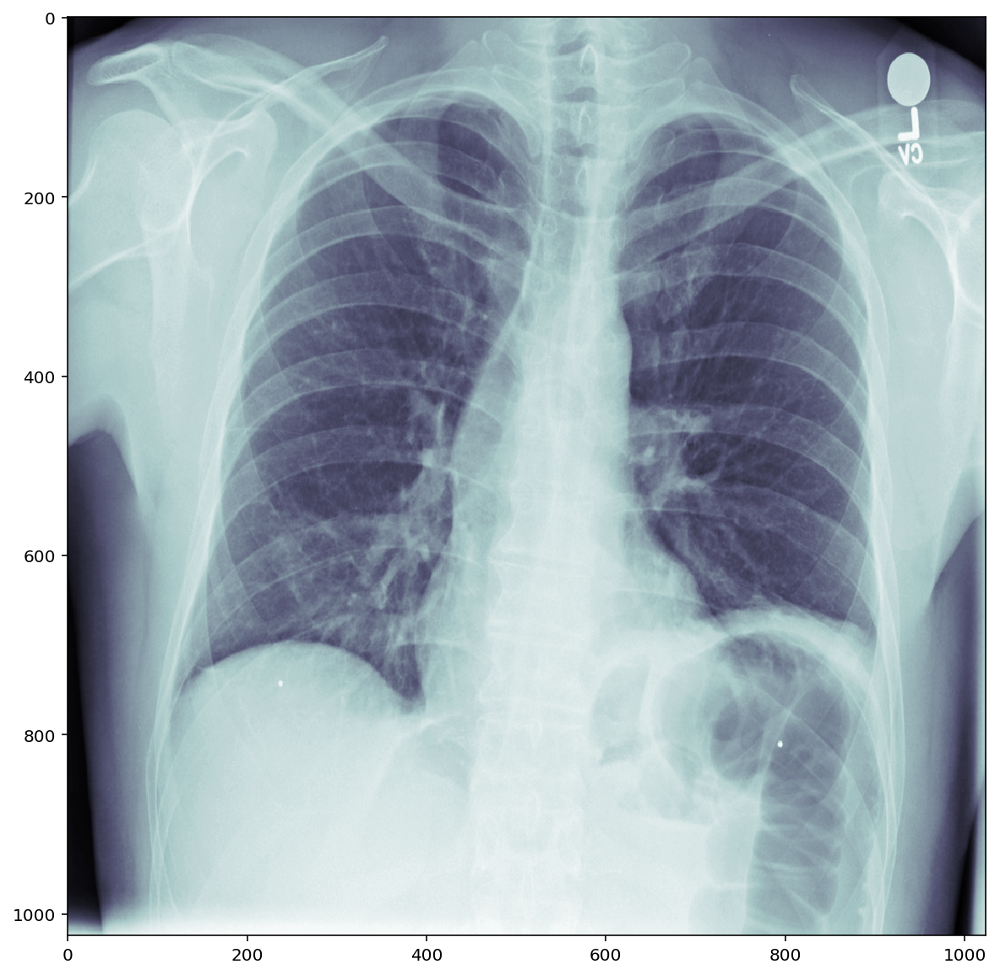

Filename.........: /content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.1521.1517875168.213791/1.2.276.0.7230010.3.1.3.8323329.1521.1517875168.213790/1.2.276.0.7230010.3.1.4.8323329.1521.1517875168.213792.dcm
Storage type.....: 1.2.840.10008.5.1.4.1.1.7

Patient's name......: ed5a86fc-06ac-456b-b6cc-0059f34008d3, 
Patient id..........: ed5a86fc-06ac-456b-b6cc-0059f34008d3
Patient's Age.......: 60
Patient's Sex.......: F
Modality............: CR
Body Part Examined..: CHEST
View Position.......: AP
Image size.......: 1024 x 1024, 116872 bytes
Pixel spacing....: ['0.168', '0.168']


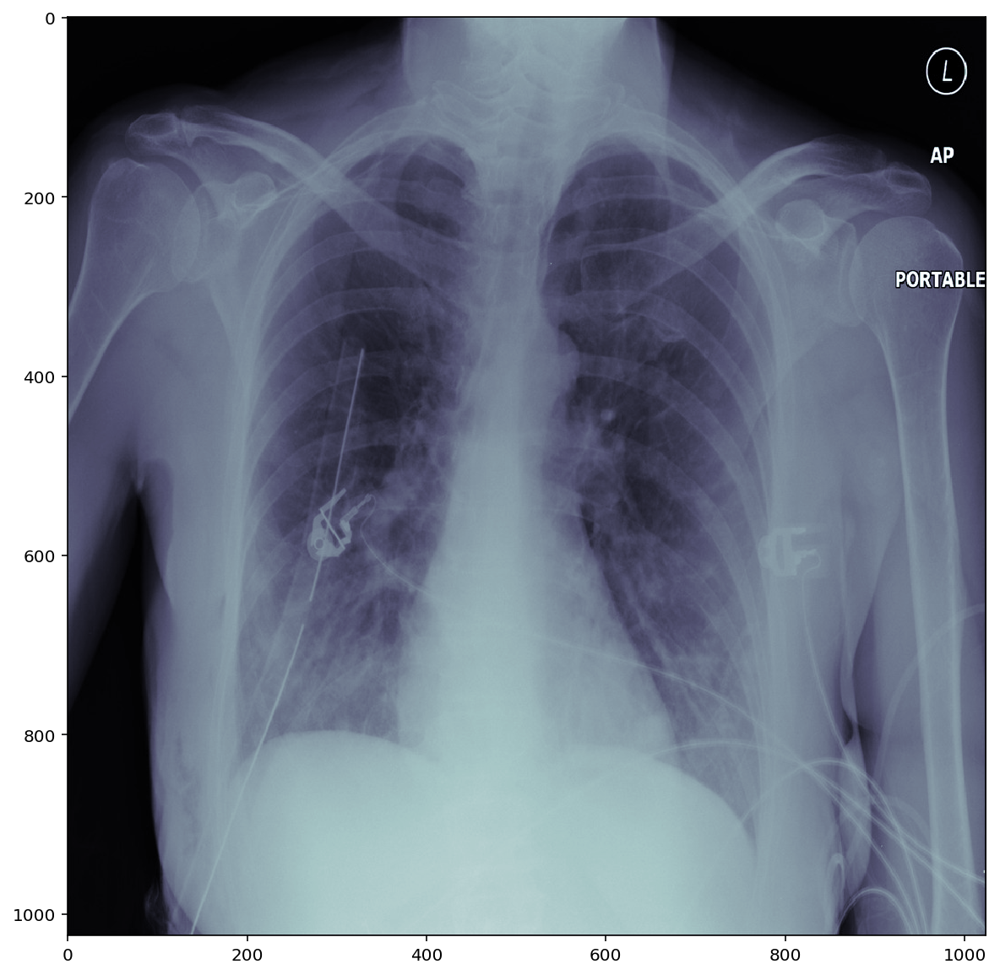

Filename.........: /content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.11208.1517875231.726428/1.2.276.0.7230010.3.1.3.8323329.11208.1517875231.726427/1.2.276.0.7230010.3.1.4.8323329.11208.1517875231.726429.dcm
Storage type.....: 1.2.840.10008.5.1.4.1.1.7

Patient's name......: 0523f3e4-2570-40e5-93e5-4e07ec515b14, 
Patient id..........: 0523f3e4-2570-40e5-93e5-4e07ec515b14
Patient's Age.......: 62
Patient's Sex.......: M
Modality............: CR
Body Part Examined..: CHEST
View Position.......: AP
Image size.......: 1024 x 1024, 146578 bytes
Pixel spacing....: ['0.139', '0.139']


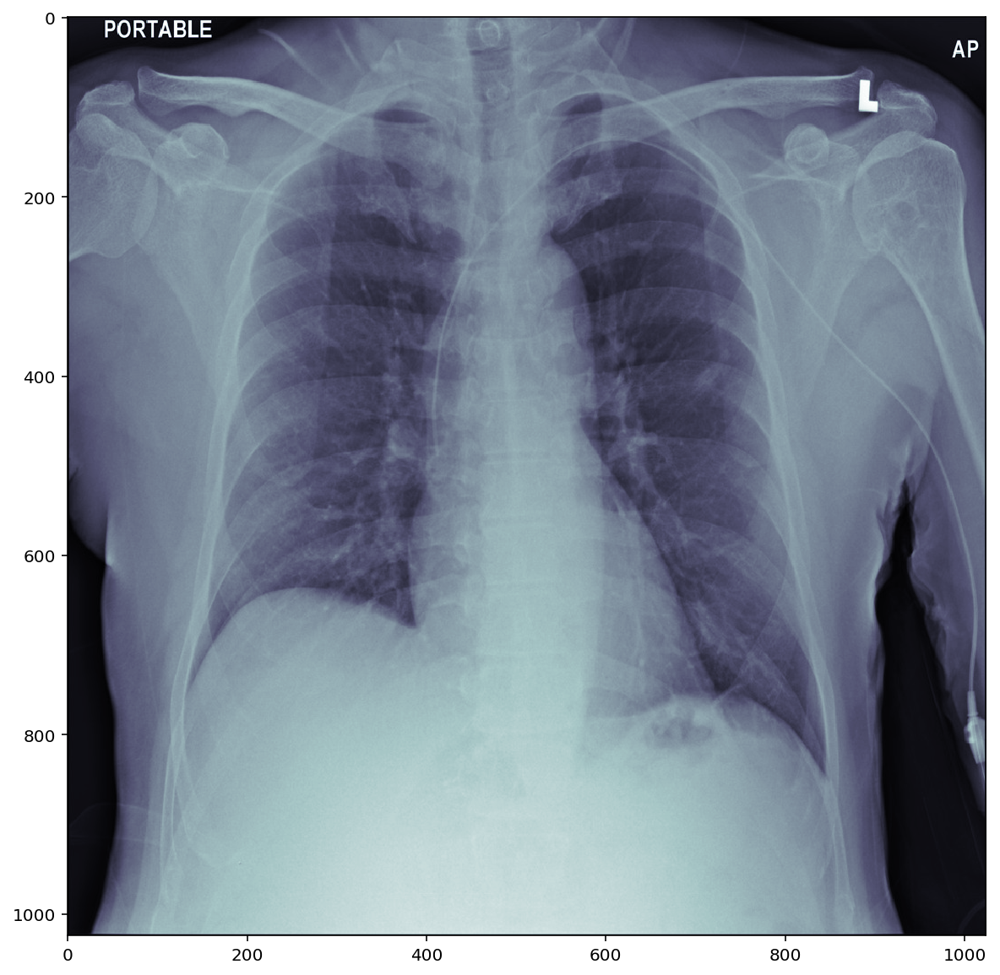

In [0]:
# get all dcm files from the test folder
def getAllFiles(path, max = 0, type = '.dcm'):
    dcmFiles = []
    for dirpath, subdirs, files in os.walk(path):
        for x in files:
            if x.endswith(type):
                dcmFiles.append([dirpath, x])
                break
        if(max > 0):        
          if len(dcmFiles) > max:
            break
         
    return dcmFiles
  
files = getAllFiles(input_dir, 2)
for file in files:
  file_path = file[0] + "/" + file[1]
  dataset = pydicom.dcmread(file_path)
  show_dcm_info(dataset, file_path)
  plot_pixel_array(dataset)
   

In [0]:
!pwd

/content


In [0]:
df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/train-rle.csv', header=None, index_col=0)
files

[['/content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.13149.1517875243.886011/1.2.276.0.7230010.3.1.3.8323329.13149.1517875243.886010',
  '1.2.276.0.7230010.3.1.4.8323329.13149.1517875243.886012.dcm'],
 ['/content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.1521.1517875168.213791/1.2.276.0.7230010.3.1.3.8323329.1521.1517875168.213790',
  '1.2.276.0.7230010.3.1.4.8323329.1521.1517875168.213792.dcm'],
 ['/content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.11208.1517875231.726428/1.2.276.0.7230010.3.1.3.8323329.11208.1517875231.726427',
  '1.2.276.0.7230010.3.1.4.8323329.11208.1517875231.726429.dcm'],
 ['/content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.1610.1517875168.587270/1.2.276.0.7230010.3.1.3.8323329.1610.1517875168.587269',
  '1.2.276.0.7230010.3.1.4.

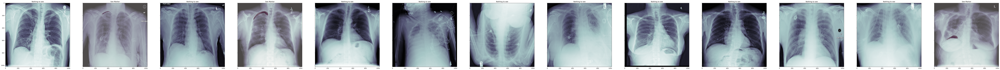

In [0]:
num_img = 13
fig, ax = plt.subplots(nrows=1, ncols=num_img, sharey=True, figsize=(num_img * 10,10))
for q,file_path in enumerate(files):    
    file_path = file_path[0] + "/" + file_path[1]
    dataset = pydicom.dcmread(file_path)    
    ax[q].imshow(dataset.pixel_array, cmap=plt.cm.bone)    
    if df.loc[file_path.split('/')[-1][:-4],1].strip() != '-1': 
      mask = rle2mask(df.loc[file_path.split('/')[-1][:-4],1], 1024, 1024).T
      ax[q].set_title('See Marker')
      ax[q].imshow(mask, alpha=0.3, cmap="Reds")
    else:
      ax[q].set_title('Nothing to see')

In [0]:
train_dir = '/content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/dicom-images-test'
test_dir = '/content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/dicom-images-train'

train_fns = getAllFiles(train_dir, 500)
test_fns = getAllFiles(test_dir, 500)

for file in files:
  file_path = file[0] + "/" + file[1]
  dataset = pydicom.dcmread(file_path)   

df_full = pd.read_csv('/content/drive/My Drive/Colab Notebooks/data/siim/siim-acr/train-rle.csv', index_col='ImageId')

In [0]:
im_height = 1024
im_width = 1024
im_chan = 1
# Get train images and masks
X_train = np.zeros((len(train_fns), im_height, im_width, im_chan), dtype=np.uint8)
Y_train = np.zeros((len(train_fns), im_height, im_width, 1), dtype=np.bool)

